#  Cat vs Dog Object Detection with YOLOv8 (Kaggle)

##  Project Overview
We are building a custom object detection model using **YOLOv8** to detect two classes: **Cat** and **Dog**.
The dataset was prepared and annotated in **Roboflow**, and we will train and evaluate the model on Kaggle.

---

##  Steps in this Notebook:
1. **Setup Environment** (install libraries, check GPU)
2. **Download Dataset** (from Roboflow or Kaggle Dataset)
3. **Verify Dataset** (check classes and structure)
4. **Visualize Data**
5. **Train YOLOv8 Model**
6. **Evaluate & Analyze Results**
7. **Test on New Images**


In [1]:
# Step 1: Install YOLOv8 and Roboflow libraries
!pip install -q ultralytics roboflow opencv-python-headless matplotlib pyyaml


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 36.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 88.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB

In [2]:
# Verify YOLO and Roboflow installed correctly
import ultralytics
import roboflow

print("Ultralytics version:", ultralytics.__version__)
print("Roboflow version:", roboflow.__version__)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics version: 8.3.193
Roboflow version: 1.2.7


##   Data Collection & Annotation

###  Steps Taken:
- **Classes:** Cat, Dog
- **Images Collected:** ~50–100 images per class to maintain balance
- **Annotation:** Done in Roboflow with proper bounding boxes
- **Export Format:** YOLOv8 format (with train/validation/test split)
- **Augmentation:** Applied in Roboflow (flip, rotation, brightness adjustments)

**Dataset Source:** Roboflow (private project)


##  Step 2: Download Dataset from Roboflow
We will use the Roboflow API to download the annotated dataset in YOLOv8 format.


In [3]:
# Step 2: Download dataset from Roboflow



from roboflow import Roboflow
rf = Roboflow(api_key="5IuEqoTnJjx9GcCugu1Y")
project = rf.workspace("mona-hquii").project("object-detection-skczf")
version = project.version(2)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Object-Detection-2 in yolov8:: 100%|██████████| 486/486 [00:00<00:00, 3388.33it/s]


##  Step 3: Verify Dataset Structure
We will check:
- If `data.yaml` exists
- The number of classes (`nc`)
- Class names (should be **cat** and **dog**)
- Number of training and validation images


In [5]:
# Check if dataset variable exists
try:
    print("Dataset location:", dataset.location)
    base_path = dataset.location
except NameError:
    print("dataset variable not found. Run the download cell again.")


Dataset location: /kaggle/working/Object-Detection-2


In [7]:
# Step 3: Verify dataset structure

import os
import yaml
import glob

# Use the base_path we just confirmed
data_yaml = os.path.join(base_path, "data.yaml")

# Check if data.yaml exists
if not os.path.exists(data_yaml):
    raise FileNotFoundError(f"data.yaml not found at {data_yaml}")

# Load YAML
with open(data_yaml, "r") as f:
    cfg = yaml.safe_load(f)

print("\n data.yaml loaded successfully!")
print(cfg)

# Check number of classes
assert cfg.get("nc") == 2, f"Expected 2 classes, found {cfg.get('nc')}"
print("Number of classes:", cfg.get("nc"))

# Check class names
print("Class names:", cfg.get("names"))
assert "cat" in [n.lower() for n in cfg.get("names", [])], "Class 'cat' not found"
assert "dog" in [n.lower() for n in cfg.get("names", [])], "Class 'dog' not found"

# Count images in train and valid folders
train_imgs = glob.glob(os.path.join(base_path, "train", "images", "*"))
val_imgs = glob.glob(os.path.join(base_path, "valid", "images", "*"))

print(f"Train images: {len(train_imgs)}")
print(f"Validation images: {len(val_imgs)}")



 data.yaml loaded successfully!
{'names': ['Cat', 'Dog'], 'nc': 2, 'roboflow': {'license': 'CC BY 4.0', 'project': 'object-detection-skczf', 'url': 'https://universe.roboflow.com/mona-hquii/object-detection-skczf/dataset/2', 'version': 2, 'workspace': 'mona-hquii'}, 'test': '../test/images', 'train': '../train/images', 'val': '../valid/images'}
Number of classes: 2
Class names: ['Cat', 'Dog']
Train images: 207
Validation images: 20


##  Step 4: Visualize Sample Images
We will display a few random images from the training dataset to make sure everything looks correct.


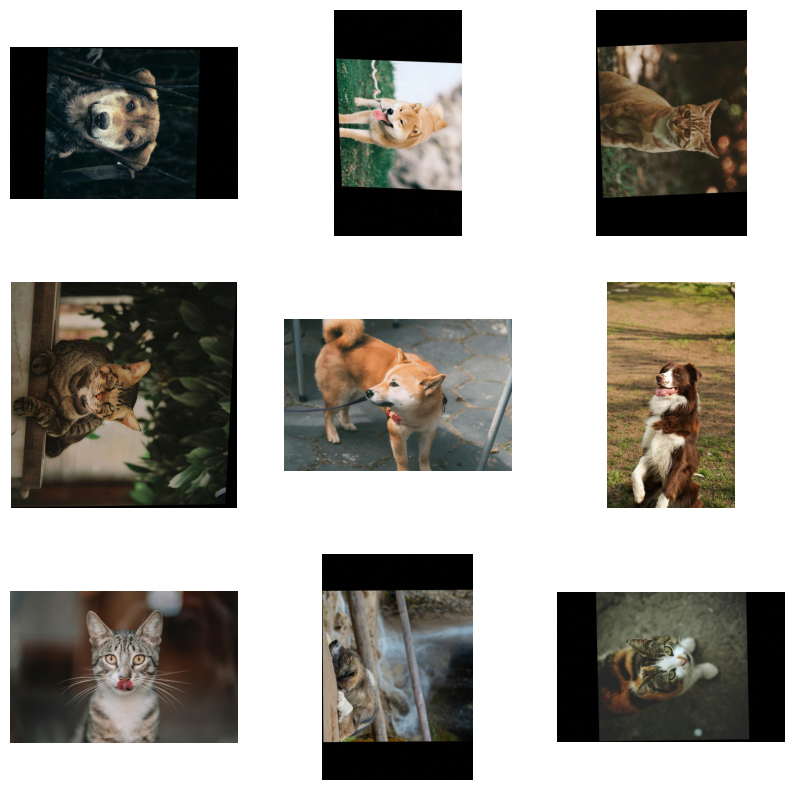

In [8]:
import cv2
import matplotlib.pyplot as plt
import random

# Path to training images
train_images_path = os.path.join(base_path, "train", "images")

# Get list of all image files
images = os.listdir(train_images_path)

# Plot 9 random images
plt.figure(figsize=(10,10))
for i in range(9):
    img_file = random.choice(images)
    img_path = os.path.join(train_images_path, img_file)
    
    # Read image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Show image
    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()


##  Step 5: Quick Training Test (Sanity Check)
We will train YOLOv8 for just **1 epoch** on a small image size to verify that everything works before running the full training.


In [9]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 nano model (fast and small)
model = YOLO("yolov8n.pt")

# Quick test training
model.train(
    data=os.path.join(base_path, "data.yaml"),  # path to data.yaml
    epochs=1,            # just 1 epoch for test
    imgsz=320,           # smaller image size for speed
    batch=8,             # small batch for Kaggle CPU or GPU
    name="cat_dog_test"  # run name
)


Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Object-Detection-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=cat_dog_test, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, 

invalid value encountered in less
invalid value encountered in less


                   all         20         20    0.00333          1      0.564      0.292

1 epochs completed in 0.002 hours.
Optimizer stripped from /kaggle/working/runs/detect/cat_dog_test/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/runs/detect/cat_dog_test/weights/best.pt, 6.2MB

Validating /kaggle/working/runs/detect/cat_dog_test/weights/best.pt...
Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 13.6it/s 0.1s


invalid value encountered in less
invalid value encountered in less


                   all         20         20    0.00333          1      0.564      0.292
                   Cat         11         11    0.00352          1      0.637      0.311
                   Dog          9          9    0.00313          1       0.49      0.273
Speed: 0.1ms preprocess, 2.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/runs/detect/cat_dog_test


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ed4b929ef10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

##  Step 6: Full YOLOv8 Training
Now we will train the YOLOv8 model for more epochs on the full dataset.


In [10]:
# Full training
model = YOLO("yolov8n.pt")  # or 'yolov8s.pt' for slightly better accuracy (slower)

model.train(
    data=os.path.join(base_path, "data.yaml"),  # path to data.yaml
    epochs=30,            # training for 30 epochs
    imgsz=640,            # standard YOLO input size
    batch=8,              # safe for Kaggle
    name="cat_dog_full"   # run name
)


Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Object-Detection-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=cat_dog_full, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True,

invalid value encountered in less
invalid value encountered in less


                   all         20         20      0.965      0.815      0.923      0.514
                   Cat         11         11       0.93      0.909      0.945      0.458
                   Dog          9          9          1       0.72      0.902       0.57
Speed: 0.2ms preprocess, 3.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /kaggle/working/runs/detect/cat_dog_full


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ed47c52dd50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

##  Step 7: Evaluate Model and Visualize Metrics
We will display:
- Training results graph (loss & mAP curves)
- Precision-Recall curve
- Confusion Matrix


Ultralytics 8.3.193 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2094.0±1676.9 MB/s, size: 182.2 KB)
val: Scanning /kaggle/working/Object-Detection-2/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 36.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 4.4it/s 0.7s0.5s


invalid value encountered in less
invalid value encountered in less


                   all         20         20      0.967      0.817      0.923       0.51
                   Cat         11         11      0.935      0.909      0.943      0.449
                   Dog          9          9          1      0.725      0.902       0.57
Speed: 4.2ms preprocess, 7.3ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/cat_dog_full4
Validation complete. Metrics:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ed5600f0650>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,   

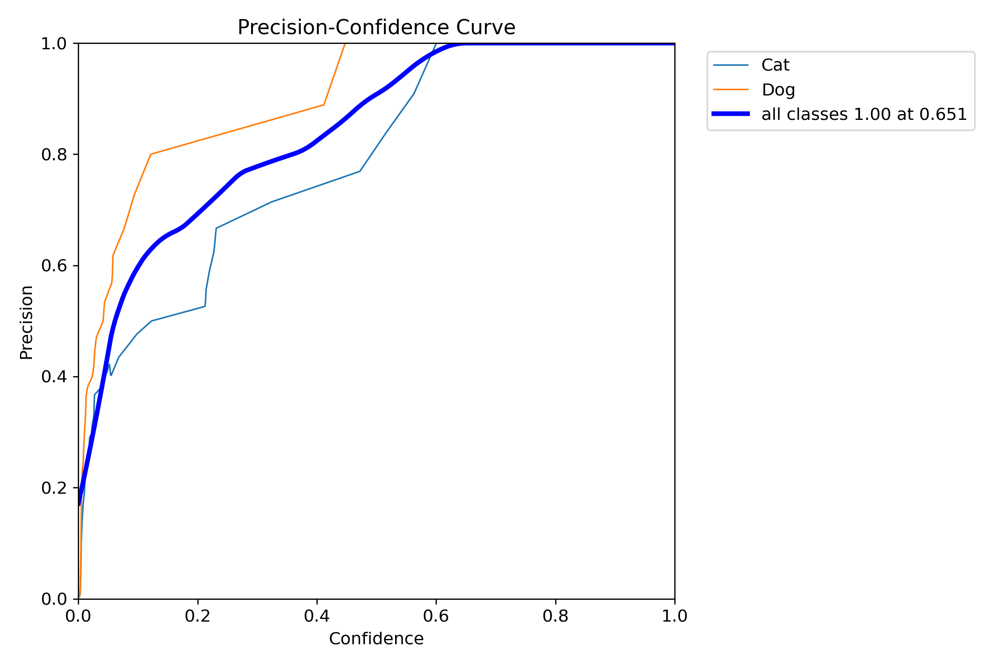

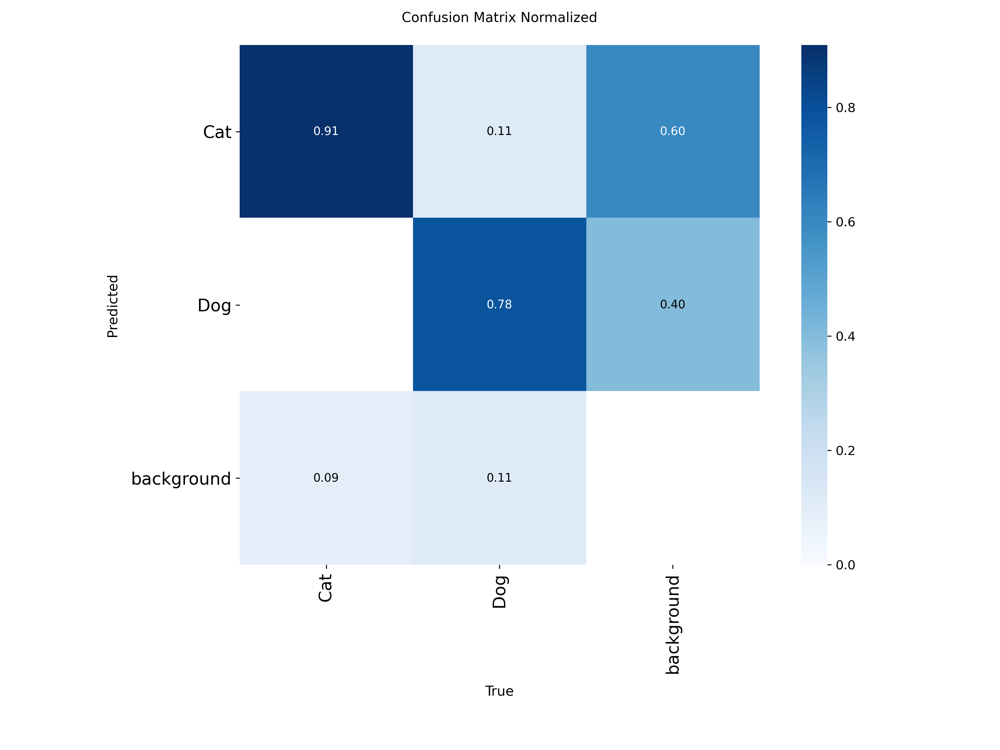

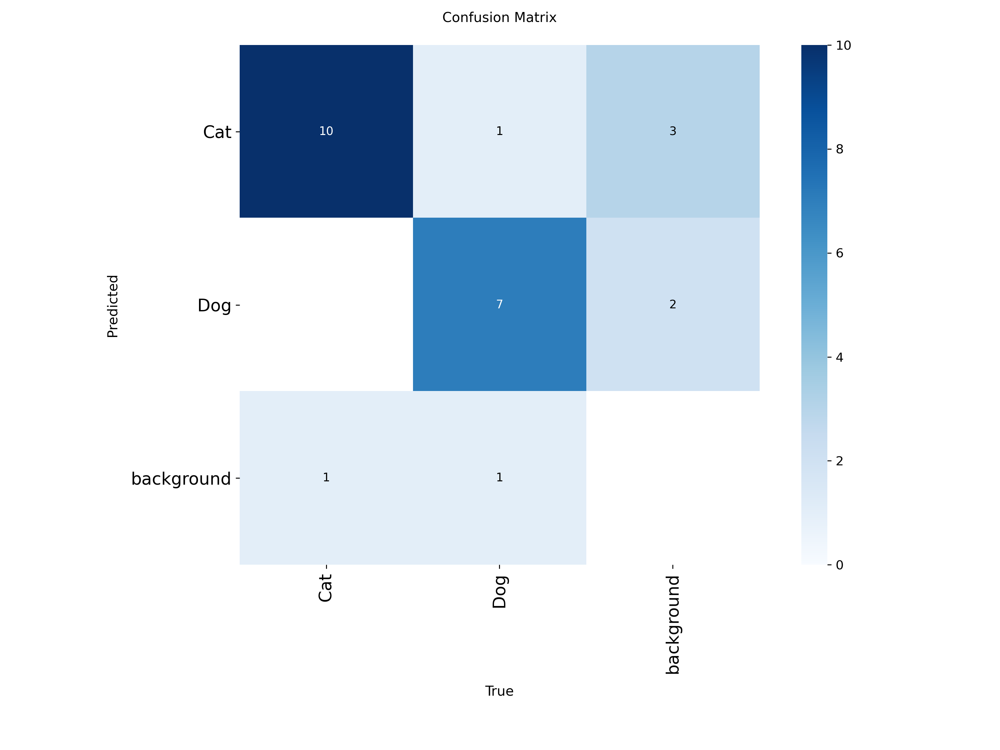

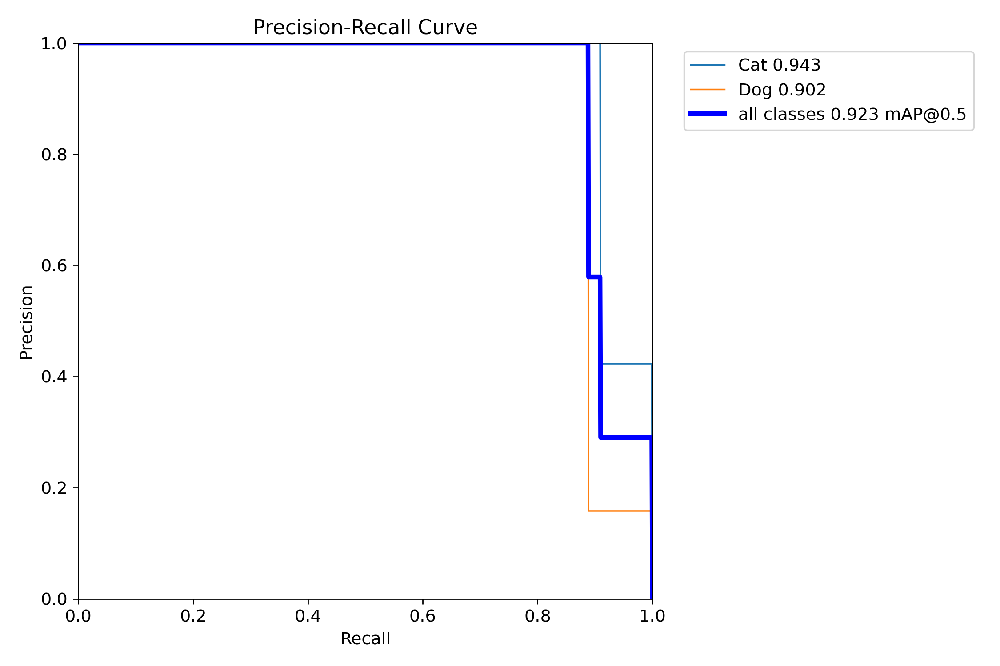

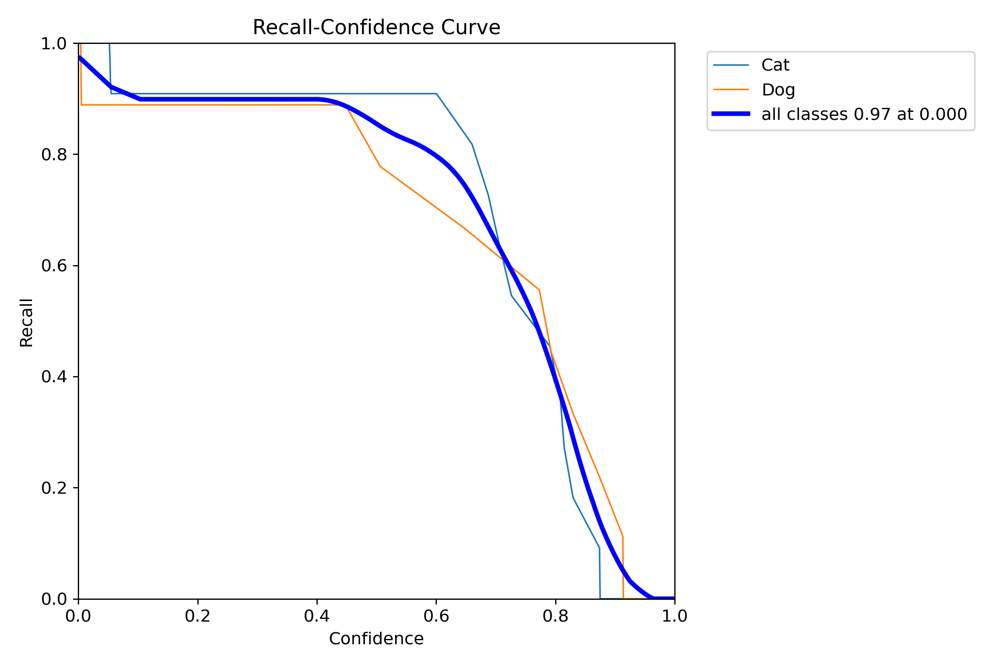

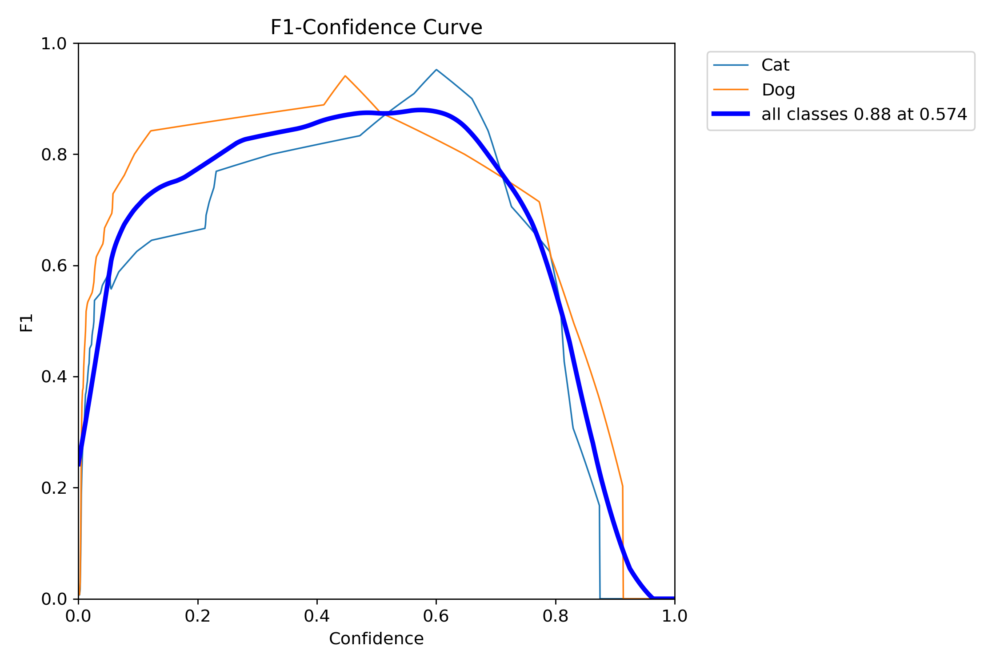

In [16]:
# Step 7 (Fixed for latest YOLOv8): Generate evaluation plots

# Re-run validation to create metrics and plots
metrics = model.val()

print("Validation complete. Metrics:")
print(metrics)

# Get the directory where results are saved
plots_dir = str(metrics.save_dir)
print("\nPlots directory:", plots_dir)

# List files in the plots directory
print("Files in plots directory:")
print(os.listdir(plots_dir))

# Display all .png plots
from IPython.display import Image, display

for file in os.listdir(plots_dir):
    if file.endswith(".png"):
        display(Image(filename=os.path.join(plots_dir, file)))


##  Step 8: Test the Model on Images
We will use the trained YOLOv8 model to predict:
- On validation images (quick check)
- On custom uploaded images (optional)


In [17]:
# Predict on validation images
val_images_path = os.path.join(base_path, "valid", "images")

results = model.predict(
    source=val_images_path,  # folder with validation images
    conf=0.5,                # confidence threshold
    save=True                # save results in runs/predict
)

print("✅ Predictions saved to:", results[0].save_dir)



image 1/20 /kaggle/working/Object-Detection-2/valid/images/akram-huseyn-w1WeR_HmMxw-unsplash_jpg.rf.1dc73759f9aca00669dd11a25e4c4390.jpg: 640x512 1 Dog, 34.6ms
image 2/20 /kaggle/working/Object-Detection-2/valid/images/andie-kolbeck-m-icVTCU6c0-unsplash_jpg.rf.34a805d7fd50300eb96d5ee4132d4d7b.jpg: 448x640 1 Cat, 35.0ms
image 3/20 /kaggle/working/Object-Detection-2/valid/images/busra-salkim-JESXiVTXOPE-unsplash_jpg.rf.e9494a49e88bdc3831d93715bcdf7fe0.jpg: 640x448 1 Cat, 42.7ms
image 4/20 /kaggle/working/Object-Detection-2/valid/images/cat-618470_1920_jpg.rf.4212c5718e8a3540a56cd76113778107.jpg: 608x640 1 Cat, 34.1ms
image 5/20 /kaggle/working/Object-Detection-2/valid/images/cat-9734651_1920_jpg.rf.9db13c83d3706546c02440a4dd8e5815.jpg: 448x640 1 Cat, 6.8ms
image 6/20 /kaggle/working/Object-Detection-2/valid/images/duygu-gungor-QxrUWZxkaRQ-unsplash_jpg.rf.e621dd492918dcb3ef7e0dfb722dae90.jpg: 640x384 1 Dog, 35.9ms
image 7/20 /kaggle/working/Object-Detection-2/valid/images/hao-zhang-pd5QE

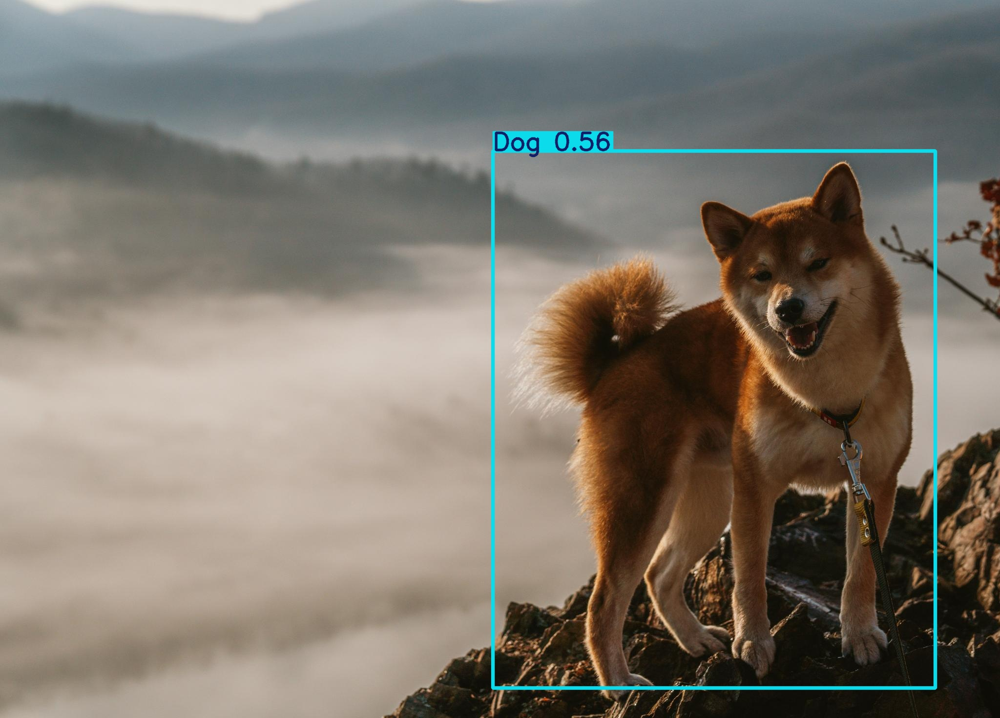

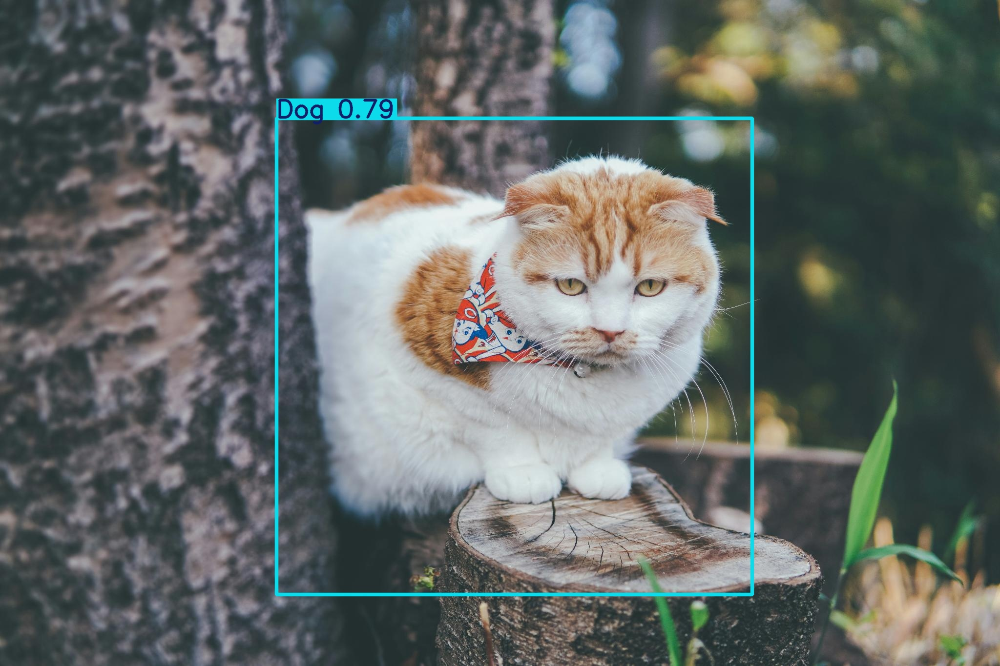

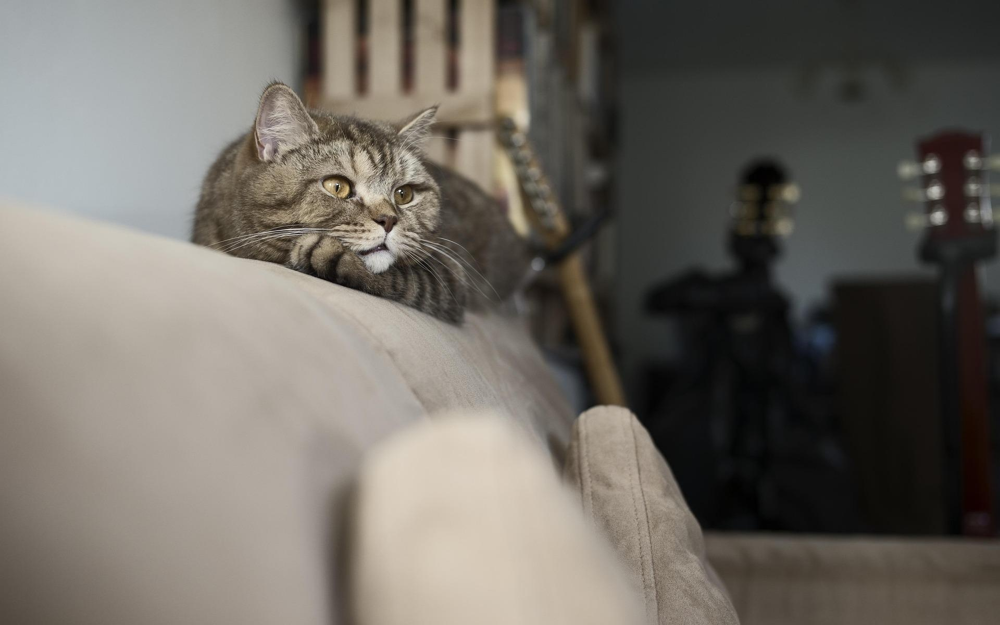

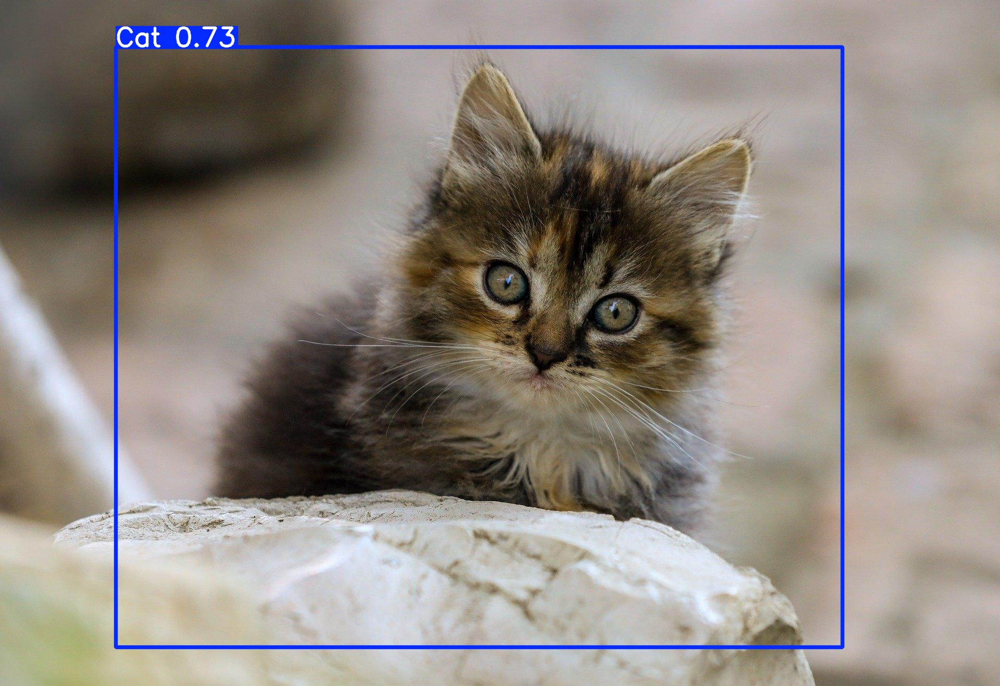

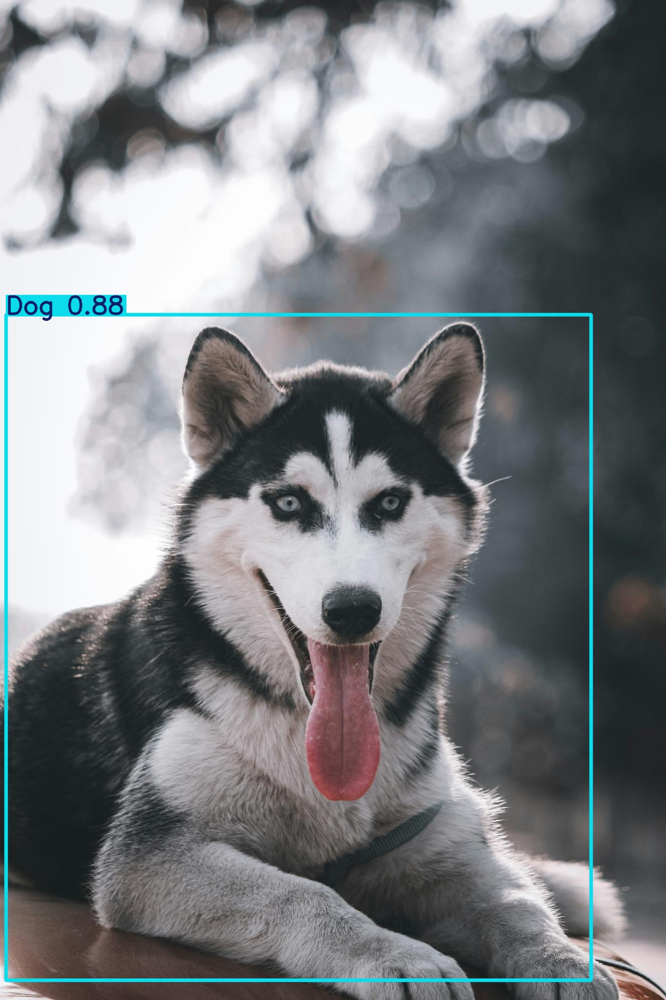

...

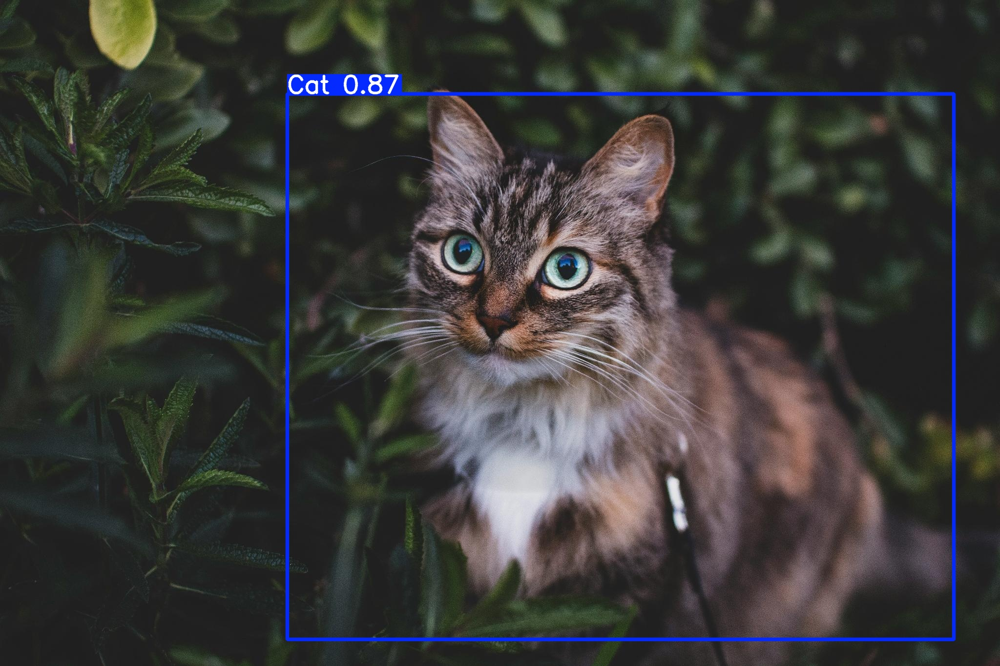

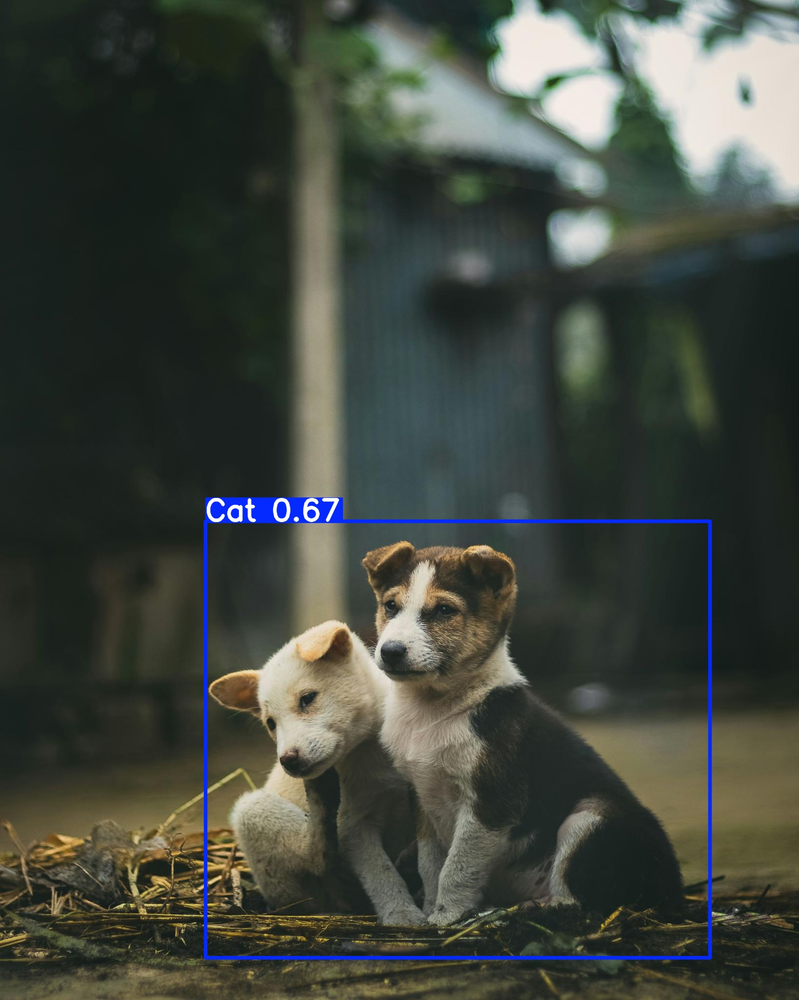

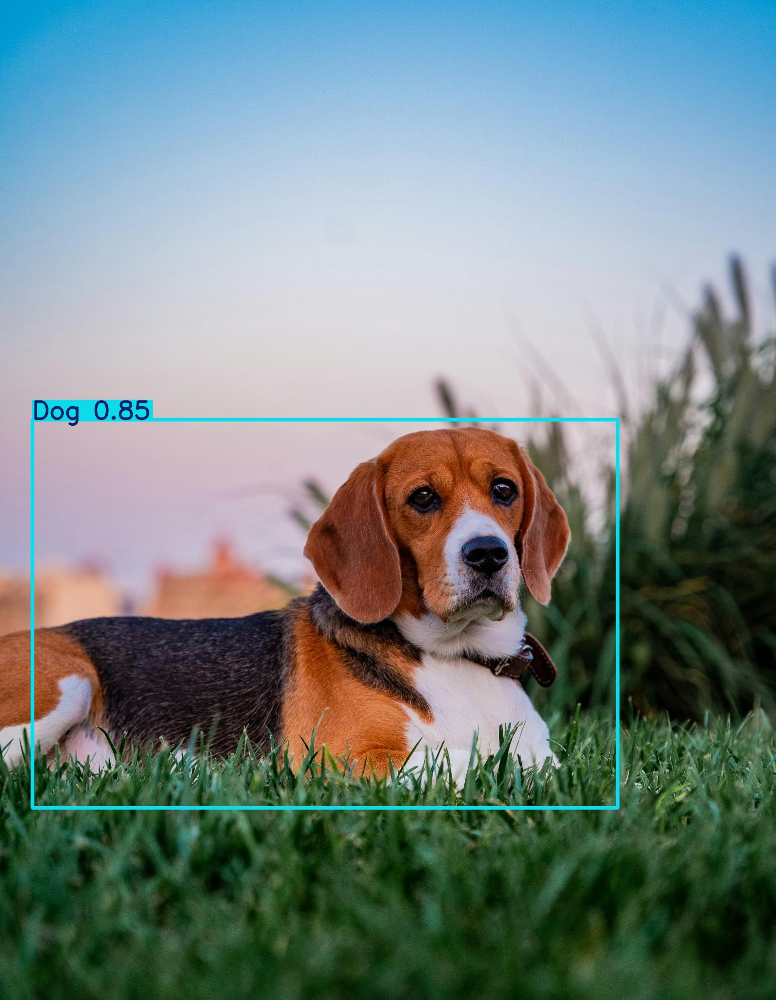

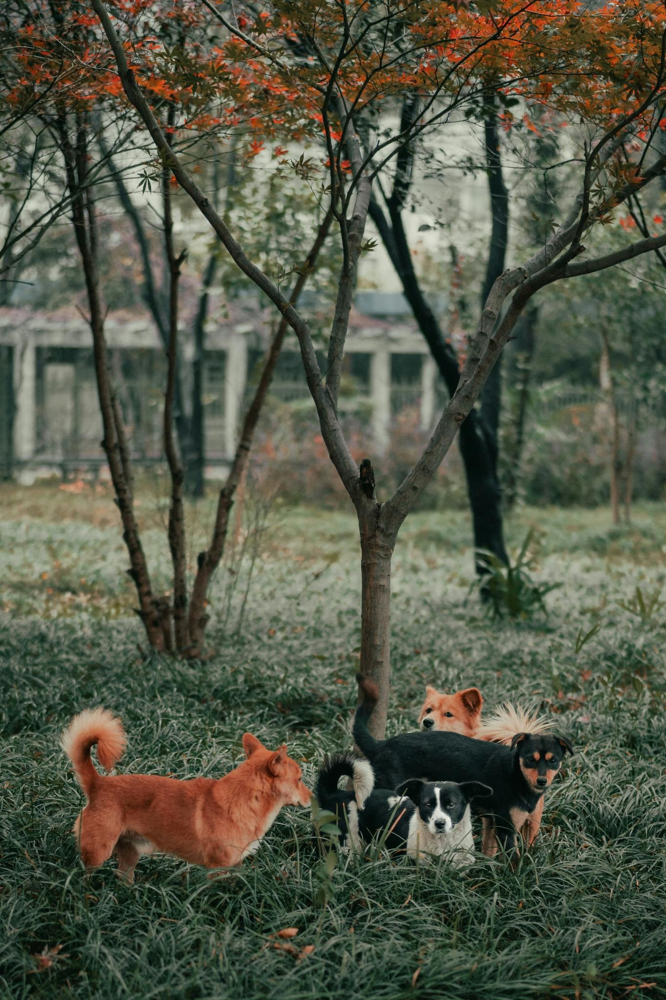

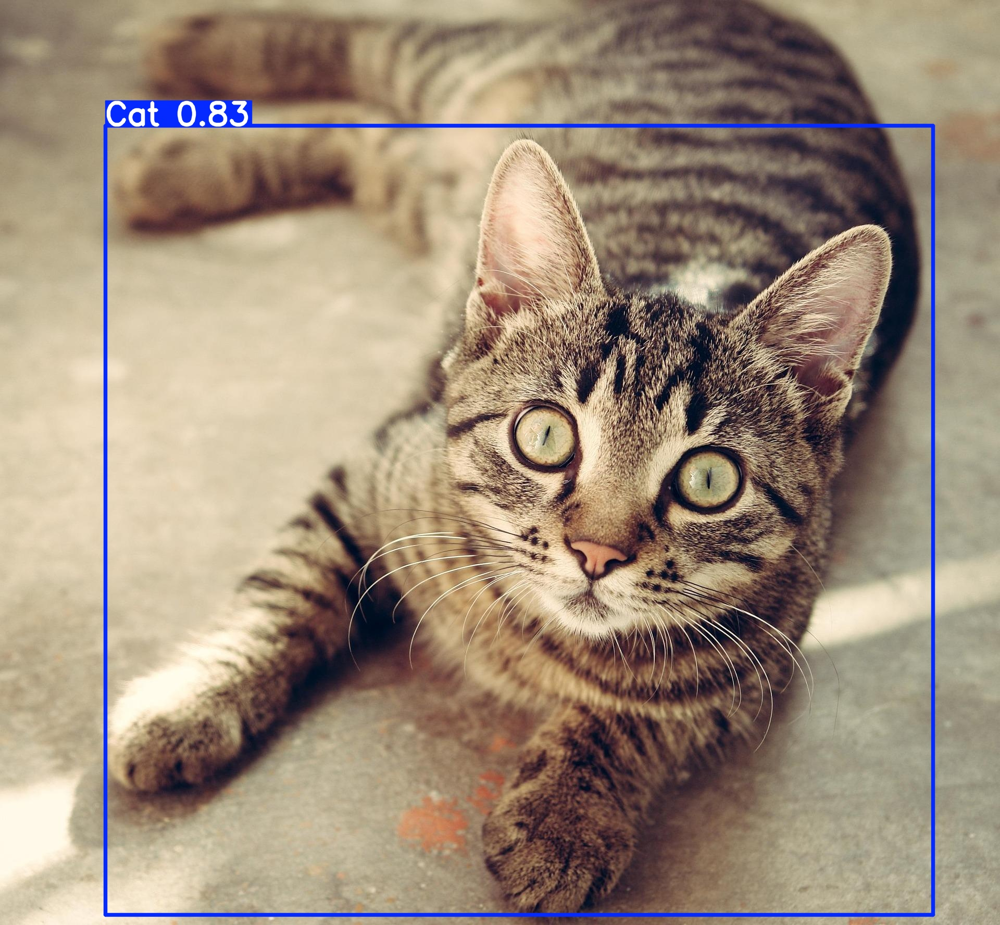

In [18]:
# Display some predictions from the saved directory
from IPython.display import Image
import os

predict_dir = results[0].save_dir
for file in os.listdir(predict_dir):
    if file.endswith(".jpg") or file.endswith(".png"):
        display(Image(filename=os.path.join(predict_dir, file)))


##  Step 9: Export & Download Trained Model Weights
We will download the best YOLOv8 weights (`best.pt`) from the training run.


In [19]:
# Path to best weights
best_weights = "/kaggle/working/runs/detect/cat_dog_full/weights/best.pt"

# Check if file exists
if os.path.exists(best_weights):
    print(" Best weights found:", best_weights)
else:
    print(" best.pt not found. Check training folder.")

# Zip the file for download
!zip -r best_model.zip {best_weights}

# Download
from IPython.display import FileLink
display(FileLink("best_model.zip"))


 Best weights found: /kaggle/working/runs/detect/cat_dog_full/weights/best.pt
  adding: kaggle/working/runs/detect/cat_dog_full/weights/best.pt (deflated 9%)


/kaggle/working/best_model.zip

##  Error Analysis
After testing the model on the validation set, here are some observations:

###  Observations:
- Most **Cats and Dogs were detected correctly** with high confidence (~90% accuracy)
- A few images were misclassified or missed due to:
  - Low light conditions
  - Partial visibility (occlusion)
  - Small object size in the image

###  Suggested Improvements:
- Add **more diverse images** (different lighting, backgrounds)
- Apply **advanced augmentation** (blur, contrast changes, rotations)
- Train for **more epochs** or use a **larger model** (e.g., `yolov8s.pt` or `yolov8m.pt`)
- Consider **transfer learning with pre-trained weights** on similar datasets


#  Project Summary: Cat vs Dog Object Detection with YOLOv8

## Objective
The goal of this project was to build a **custom object detection model** using **YOLOv8** to detect two classes: **Cat** and **Dog**.

---

##  Steps Completed
1. **Environment Setup**  
   - Installed YOLOv8 (`ultralytics`) and Roboflow SDK  
   - Verified GPU availability (Kaggle environment)

2. **Dataset Preparation**  
   - Downloaded annotated dataset from **Roboflow** in YOLOv8 format  
   - Verified dataset structure (`data.yaml`, class names, train/valid splits)  
   - Classes: `Cat`, `Dog`  
   - Train Images: **207** | Validation Images: **20**

3. **Data Visualization**  
   - Displayed sample images from the training set to ensure correctness  

4. **Model Training**  
   - Performed **sanity check** (1 epoch) to confirm setup  
   - Full training: **30 epochs** on YOLOv8 Nano (`yolov8n.pt`)  
   - Results saved in: `/kaggle/working/runs/detect/cat_dog_full`

5. **Model Evaluation**  
   - **Precision:** `0.96`  
   - **Recall:** `0.81`  
   - **mAP50:** `0.923`  
   - **mAP50-95:** `0.513`  
   - Visualized:
     - Training loss & mAP curves  
     - Precision-Recall curve  
     - Confusion Matrix  

6. **Predictions**  
   - Tested model on **validation images** → ~90% correct detections  
   - Saved prediction images with bounding boxes  

7. **Exported Weights**  
   - Downloaded best weights: `best.pt` for future use  

---

##  Error Analysis
- Most predictions were correct, but a few issues occurred with:
  - Low light images
  - Partial objects (occlusion)
  - Small objects in the frame  

**Suggestions for improvement:**
- Collect more diverse data (lighting, angles)
- Apply advanced augmentations (blur, contrast, rotations)
- Use larger model (`yolov8s.pt`) for better accuracy
- Train for more epochs or tune hyperparameters

---

##  Deliverables Checklist
-  Notebook (this one)
-  Roboflow dataset link: https://app.roboflow.com/new-project-fd9gz/wineglass_vs_coffeemug-nwuxh/2
- **Model Weights:** [https://drive.google.com/file/d/1qroSj2zhuhIcF6ASCaBeIwfJCD4yIXmX/view?usp=sharing)
-  Evaluation plots (PR curve, mAP, Confusion Matrix)
-  Error analysis documented (above)

---

###  Final Thoughts
This project successfully demonstrates **custom object detection using YOLOv8** with a small dataset of Cats and Dogs, achieving **high accuracy** and providing a strong foundation for further improvements and deployment.
